In [1]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pyvips
import glob
import random
from tqdm import tqdm

# Params
sample_n = 32

# Paths
root = '/media/latlab/MR/projects/kaggle-ubc-ocean'
data_dir = os.path.join(root, 'data')
results_dir = os.path.join(root, 'results')
train_csv = 'train.csv'
train_image_dir = os.path.join(data_dir, 'train_images')
train_thumbnail_dir = os.path.join(data_dir, 'train_thumbnails')
train_mask_dir = os.path.join(data_dir, 'train_masks')
tile_set_name = 'train_tiles_2048_p25_test_v1'
tiles_dir = os.path.join(results_dir, tile_set_name)
out_name = tile_set_name + f'_only_tumor_sample{sample_n}'

# Load data
df = pd.read_csv(os.path.join(data_dir, train_csv))
df

'train_tiles_2048_p25_test_v1_only_tumor_sample32'

In [2]:
# Tumor detect model
import torch
from torchvision import models
from torch import nn
from utils import seed_everything
from torchvision import transforms

CFG = {
    'seed': 42,
    'cv_fold': 5,
    'base_model': 'resnet18',   # resnet18/34/50, efficientnet_b0/b1/b2/b3/b4
    'img_size': 512,
    'batch_size': 32,
    'img_color_mean': [0.8708488980328596, 0.75677901508938, 0.8545134911215124],
    'img_color_std': [0.08086288591996027, 0.11553960008706814, 0.06914169213328555],
}
# Label encoder/decoder
encode = {True: 0, False: 1}
decode = {v: k for k, v in encode.items()}

# Paths
model_path = os.path.join(results_dir, 'models', 'spec', 'tumor_detect_resnet18_v1.pt')

seed_everything(CFG['seed'])
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.Resize(CFG['img_size']),
    transforms.ToTensor(),
    transforms.Normalize(mean=CFG['img_color_mean'], std=CFG['img_color_std'])
    ])

model = models.get_model(CFG['base_model']).to(device)
model.fc = nn.Linear(in_features=model.fc.in_features, out_features=2).to(device)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval();

In [3]:
tiles_df = pd.DataFrame(columns=['image_id', 'orig_image_id', 'label', 'orig_image_width', 'orig_image_height', 'is_tma'])
for i, row in tqdm(df.iterrows(), total=len(df)):
    orig_image_id = row['image_id']

    # Classify if tumor or not
    image_path_list = [p for p in glob.glob(f'{tiles_dir}/{orig_image_id}/*.png')]
    random.shuffle(image_path_list)
    tumor_img_num = 0
    image_id_list = []
    for img_idx, image_path in enumerate(image_path_list):
        image = Image.open(image_path)
        image = transform(image).unsqueeze_(0)

        with torch.no_grad():    
            inputs = image.to(device, dtype=torch.float)
            outputs = model(inputs)
            _, pred = torch.max(outputs, 1)
            label = decode[pred.item()]

        # Save tumor tile to df
        if label:
            tumor_img_num += 1
            image_id_list += [os.path.splitext(os.path.basename(image_path))[0]]
            
        if tumor_img_num >= sample_n:
            break
    
    curr_df = pd.DataFrame({'image_id': image_id_list, 
                            'orig_image_id': orig_image_id, 
                            'label': row['label'], 
                            'orig_image_width': row['image_width'], 
                            'orig_image_height': row['image_height'], 
                            'is_tma': row['is_tma']})
    tiles_df = pd.concat((tiles_df, curr_df))
tiles_df = tiles_df.reset_index(drop=True)
tiles_df

100%|██████████| 538/538 [09:29<00:00,  1.06s/it]


,image_id,orig_image_id,label,orig_image_width,orig_image_height,is_tma
0,000055_8-5,4,HGSC,23785,20008,False
1,000048_1-5,4,HGSC,23785,20008,False
2,000049_2-5,4,HGSC,23785,20008,False
3,000057_10-5,4,HGSC,23785,20008,False
4,000015_4-2,4,HGSC,23785,20008,False
...,...,...,...,...,...,...
15731,000254_2-12,65533,HGSC,45190,33980,False
15732,000015_16-1,65533,HGSC,45190,33980,False
15733,000188_5-9,65533,HGSC,45190,33980,False
15734,000089_21-4,65533,HGSC,45190,33980,False


In [4]:
tiles_df.to_csv(os.path.join(results_dir, f'{out_name}.csv'), index=False)

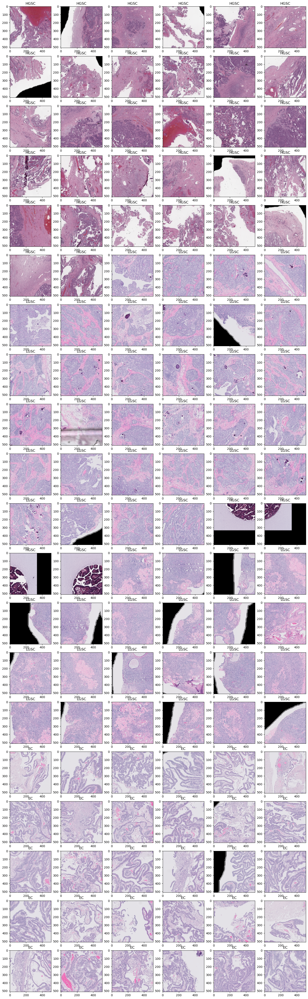

In [5]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tiles_df.iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    # img = plt.imread(img_path)
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title(row['label'])
    ax.imshow(img)